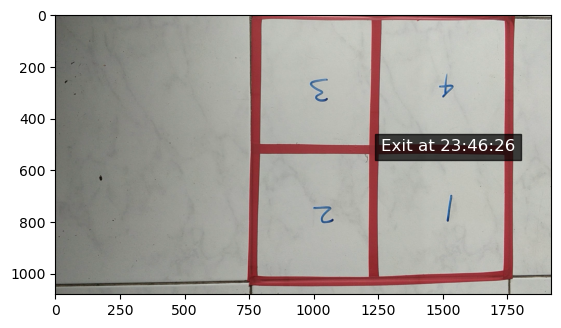

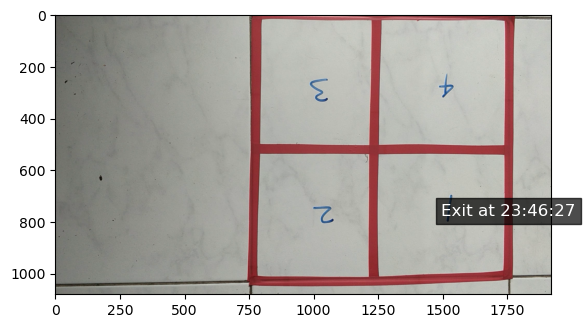

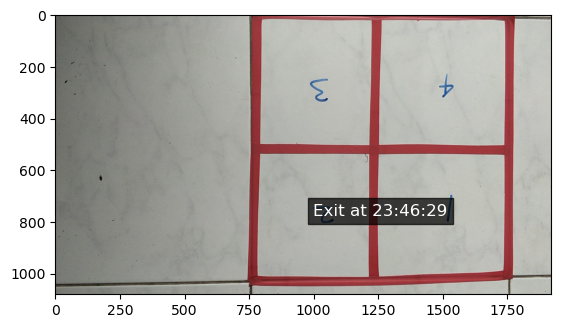

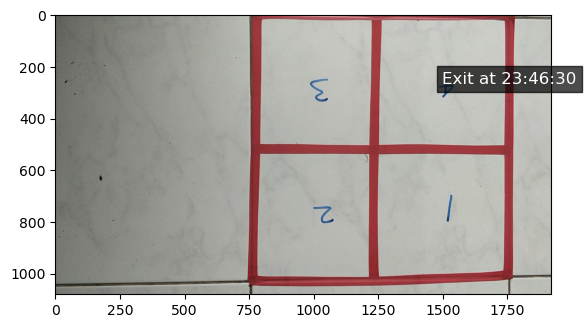

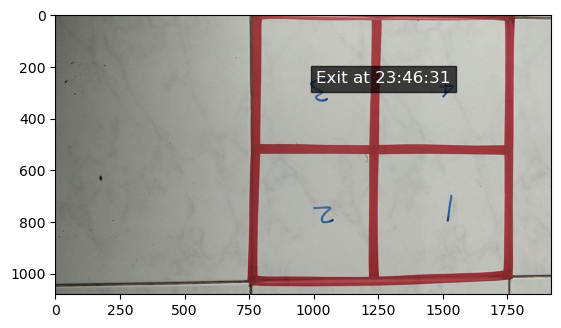

...

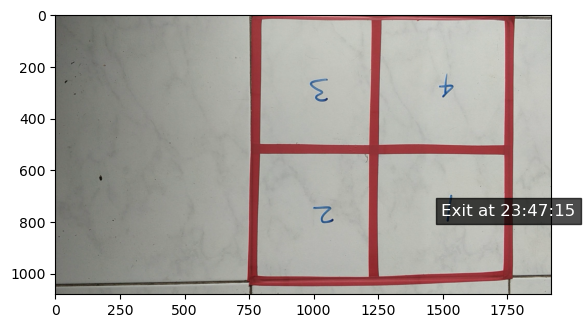

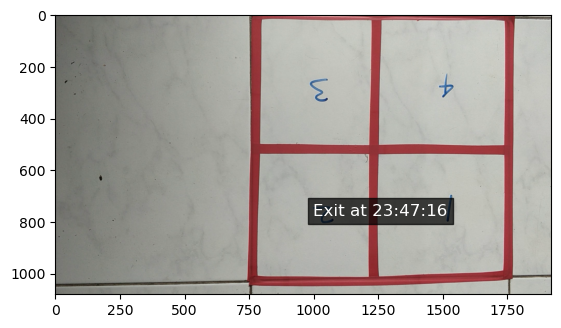

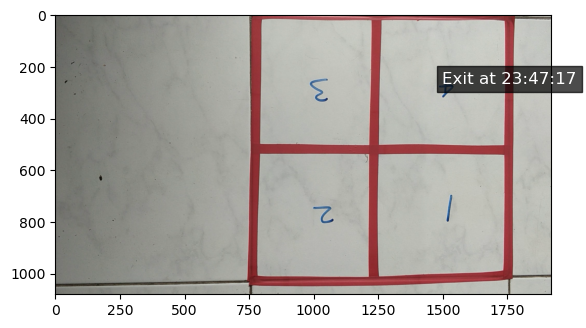

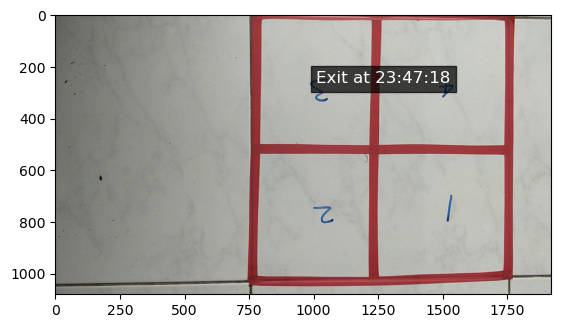

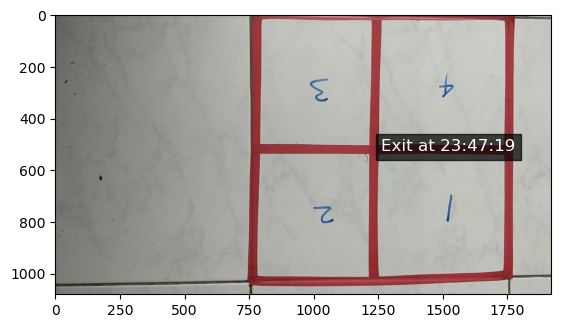

KeyboardInterrupt: 

In [1]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import time
import csv

# Function to detect red balls (you may need to adapt this for different colors)
def detect_red_balls(frame):
    # Convert frame to HSV
    hsv_frame = cv2.cvtColor(frame, cv2.COLOR_BGR2HSV)
    
    # Define red range in HSV
    lower_red = np.array([0, 50, 50])
    upper_red = np.array([10, 255, 255])
    mask1 = cv2.inRange(hsv_frame, lower_red, upper_red)
    
    lower_red = np.array([170, 50, 50])
    upper_red = np.array([180, 255, 255])
    mask2 = cv2.inRange(hsv_frame, lower_red, upper_red)
    
    mask = mask1 + mask2
    
    # Find contours in the mask and filter by area to get the balls
    contours, _ = cv2.findContours(mask, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)
    balls = []
    for contour in contours:
        area = cv2.contourArea(contour)
        if area > 100:  # Adjust area threshold as needed
            x, y, w, h = cv2.boundingRect(contour)
            balls.append({
                'x': x + w // 2,
                'y': y + h // 2,
                'color': 'red'  # Change color based on your detection logic
            })
    
    return balls

# Function to determine quadrant based on ball position
def calculate_quadrant(frame_width, frame_height, ball_x, ball_y):
    # Define quadrants (for example, dividing frame into a 3x3 grid)
    quadrant_width = frame_width // 3
    quadrant_height = frame_height // 3
    
    # Determine which quadrant the ball belongs to
    column = min(ball_x // quadrant_width, 2)
    row = min(ball_y // quadrant_height, 2)
    
    # Calculate quadrant number
    quadrant_number = row * 3 + column + 1
    
    return quadrant_number

# Main function to track balls and record events
def track_balls(video_path):
    cap = cv2.VideoCapture(video_path)
    if not cap.isOpened():
        print("Error: Could not open video.")
        return
    
    frame_width = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
    frame_height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))
    fps = cap.get(cv2.CAP_PROP_FPS)
    frame_count = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))
    
    events = []
    prev_balls = []
    
    while True:
        ret, frame = cap.read()
        if not ret:
            break
        
        balls = detect_red_balls(frame)
        
        for ball in balls:
            ball_x, ball_y = ball['x'], ball['y']
            ball_color = ball['color']
            current_quadrant = calculate_quadrant(frame_width, frame_height, ball_x, ball_y)
            
            # Check if ball is entering or exiting a quadrant
            for prev_ball in prev_balls:
                if prev_ball['color'] == ball_color:
                    prev_quadrant = calculate_quadrant(frame_width, frame_height, prev_ball['x'], prev_ball['y'])
                    if prev_quadrant != current_quadrant:
                        # Record Entry event
                        events.append({
                            'timestamp': time.time(),
                            'quadrant_number': current_quadrant,
                            'ball_color': ball_color,
                            'event_type': 'Entry'
                        })
                        # Record Exit event
                        events.append({
                            'timestamp': time.time(),
                            'quadrant_number': prev_quadrant,
                            'ball_color': ball_color,
                            'event_type': 'Exit'
                        })
                        # Display using matplotlib for Exit event
                        plt.imshow(cv2.cvtColor(frame, cv2.COLOR_BGR2RGB))
                        plt.text(ball_x, ball_y, f"Exit at {time.strftime('%H:%M:%S', time.localtime())}", color='white', fontsize=12, bbox=dict(facecolor='black', alpha=0.7))
                        plt.show()  # Show the plot for Exit event
                        break
        
        prev_balls = balls
    
    # After processing all frames, save events to CSV
    save_events_to_csv(events, 'events.csv')
    
    cap.release()
    cv2.destroyAllWindows()

# Function to save events to CSV
def save_events_to_csv(events, file_path):
    with open(file_path, mode='w', newline='') as file:
        fieldnames = ['timestamp', 'quadrant_number', 'ball_color', 'event_type']
        writer = csv.DictWriter(file, fieldnames=fieldnames)
        
        writer.writeheader()
        for event in events:
            writer.writerow(event)

# Entry point
if __name__ == '__main__':
    video_path = r'C:\Users\NAMAN\Downloads\AI Assignment video.mp4'  # Update this with your video path
    track_balls(video_path)
